# Train an anti-aliased U-net based GAN

## Imports and GPU identification

In [1]:
import tensorflow as tf
import os
from PIL import Image
from scipy import special
import numpy as np
from matplotlib import pyplot as plt
from tensorflow.python.client import device_lib
from datetime import datetime
import time
from IPython.display import clear_output
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
from scipy.linalg import sqrtm


#%rm -rf ./logs/

print(device_lib.list_local_devices())
print(tf.config.experimental.get_memory_info("/device:GPU:0")['current'])

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 1549267393810602442
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 30461702144
locality {
  bus_id: 1
  links {
  }
}
incarnation: 5677498891959451393
physical_device_desc: "device: 0, name: GRID V100S-32Q, pci bus id: 0000:02:00.0, compute capability: 7.0"
xla_global_id: 416903419
]
0


In [2]:
if False:
  print("Downsampling, even size input, even size kernel:")
  print("Input:")
  input_ = tf.ones((1, 8, 8, 1), dtype=tf.float32)
  print(input_[0, :, :, 0].numpy())
  print("Kernel:")
  kernel = tf.ones((4, 4, 1, 1), dtype=tf.float32)
  print(kernel[:, :, 0, 0].numpy())
  print("Output of strides = 2, padding = 'SAME' convolution:")
  conv = tf.nn.conv2d(input = input_, filters = kernel, strides = 2, padding = 'SAME')
  print(conv[0, :, :, 0].numpy())
  print("The output is properly centered.")
  print("Output size = input size / 2")

  print("\nDownsampling, odd size input, even size kernel:")
  print("Input:")
  input_ = tf.ones((1, 7, 7, 1), dtype=tf.float32)
  print(input_[0, :, :, 0].numpy())
  print("Kernel:")
  kernel = tf.ones((4, 4, 1, 1), dtype=tf.float32)
  print(kernel[:, :, 0, 0].numpy())
  print("Output of strides = 2, padding = 'SAME' convolution:")
  conv = tf.nn.conv2d(input = input_, filters = kernel, strides = 2, padding = 'SAME')
  print(conv[0, :, :, 0].numpy())
  print("Invalid output centering! Don't do this.")

  print("\nDownsampling, even size input, odd size kernel:")
  print("Input:")
  input_ = tf.ones((1, 8, 8, 1), dtype=tf.float32)
  print(input_[0, :, :, 0].numpy())
  print("Kernel:")
  kernel = tf.ones((3, 3, 1, 1), dtype=tf.float32)
  print(kernel[:, :, 0, 0].numpy())
  print("Output of strides = 2, padding = 'SAME' convolution:")
  conv = tf.nn.conv2d(input = input_, filters = kernel, strides = 1, padding = 'SAME')
  print(conv[0, :, :, 0].numpy())
  print("Invalid output centering! Don't do this.")

  print("\nDownsampling, odd size input, odd size kernel:")
  print("Input:")
  input_ = tf.ones((1, 9, 9, 1), dtype=tf.float32)
  print(input_[0, :, :, 0].numpy())
  print("Kernel:")
  kernel = tf.ones((5, 5, 1, 1), dtype=tf.float32)
  print(kernel[:, :, 0, 0].numpy())
  print("Output of strides = 2, padding = 'SAME' convolution:")
  conv = tf.nn.conv2d(input = input_, filters = kernel, strides = 1, padding = 'SAME')
  print(conv[0, :, :, 0].numpy())
  print("The output is properly centered.")
  print("Output size = (input size + 1) / 2")

In [3]:
if False:
  print("Upsampling, any size input, even size kernel:")
  print("Input:")
  input_ = tf.ones((1, 4, 4, 1), dtype=tf.float32)
  print(input_[0, :, :, 0].numpy())
  tile = tf.constant([[0, 0], [0, 4]], dtype=tf.float32)
  input_shape = input_.get_shape()
  tiles = tf.reshape(tf.tile(tile, [input_shape[-3], input_shape[-2]]), (1, input_shape[-3]*2, input_shape[-2]*2, 1))
  print("Diluted:")
  diluted = tf.keras.layers.UpSampling2D(size = (2, 2), interpolation='nearest')(input_)*tiles
  print(diluted[0, :, :, 0].numpy());
  print("Kernel:")
  kernel = tf.ones((4, 4, 1, 1), dtype=tf.float32)
  print(kernel[:, :, 0, 0].numpy())
  print("Output of strides = 1, padding = 'SAME' convolution:")
  conv = tf.nn.conv2d(input = diluted, filters = kernel, strides = 1, padding = 'SAME')
  print(conv[0, :, :, 0].numpy())
  print("The output is properly centered.")
  print("Output size = input size * 2")

  print("\nUpsampling, any size input, odd size kernel:")
  print("Input:")
  input_ = tf.ones((1, 4, 4, 1), dtype=tf.float32)
  print(input_[0, :, :, 0].numpy())
  tile = tf.constant([[0, 0], [0, 4]], dtype=tf.float32)
  input_shape = input_.get_shape()
  tiles = tf.reshape(tf.tile(tile, [input_shape[-3], input_shape[-2]])[1:,1:], (1, input_shape[-3]*2 - 1, input_shape[-2]*2 - 1, 1))
  print("Diluted:")
  diluted = tf.keras.layers.UpSampling2D(size = (2, 2), interpolation='nearest')(input_)[:,1:,1:,:]*tiles
  print(diluted[0, :, :, 0].numpy());
  print("Kernel:")
  kernel = tf.ones((3, 3, 1, 1), dtype=tf.float32)
  print(kernel[:, :, 0, 0].numpy())
  print("Output of strides = 1, padding = 'SAME' convolution:")
  conv = tf.nn.conv2d(input = diluted, filters = kernel, strides = 1, padding = 'SAME')
  print(conv[0, :, :, 0].numpy())
  print("The output is properly centered.")
  print("Output size = input size * 2 - 1")


## Circularly symmetric low-pass or anti-aliasing filter
Functions for generating a filter kernel with a parameterized cutoff frequency and kernel size

In [4]:
def circular_lowpass_kernel(omega_c, N):  # omega = cutoff frequency in radians (pi is max), N = horizontal size of the kernel, also its vertical size.
  with np.errstate(divide='ignore',invalid='ignore'):    
      kernel = np.fromfunction(lambda x, y: omega_c*special.j1(omega_c*np.sqrt((x - (N - 1)/2)**2 + (y - (N - 1)/2)**2))/(2*np.pi*np.sqrt((x - (N - 1)/2)**2 + (y - (N - 1)/2)**2)), [N, N])
  if N % 2:
      kernel[(N - 1)//2, (N - 1)//2] = omega_c**2/(4*np.pi)
  return kernel

def rotated_cosine_window(N):  # N = horizontal size of the targeted kernel, also its vertical size, must be odd.
  return np.fromfunction(lambda y, x: np.maximum(np.cos(np.pi/2*np.sqrt(((x - (N - 1)/2)/((N - 1)/2 + 1))**2 + ((y - (N - 1)/2)/((N - 1)/2 + 1))**2)), 0), [N, N])

def windowed_circular_lowpass_kernel(cutoff, kernel_size):
  return (circular_lowpass_kernel(cutoff, kernel_size)*rotated_cosine_window(kernel_size)).astype(np.float32);

def test_kernel(kernel):
  kernel_size = kernel.shape[0] #height, should be same as width

  print("Kernel:")
  plt.imshow(kernel, vmin=-0.25, vmax=0.25, cmap='bwr', extent=[-kernel_size/2, kernel_size/2, -kernel_size/2, kernel_size/2])
  plt.colorbar()
  plt.show()

  print("Frequency response:")
  freq_resp = np.abs(np.fft.fftshift(np.fft.fft2(np.roll(np.pad(kernel, 101, mode = 'constant', constant_values = 0), shift = (-kernel_size//2-99, -kernel_size//2-99), axis = (0, 1)))))
  plt.imshow(freq_resp, vmin=-1.2, vmax=1.2, cmap='bwr', extent=[-np.pi, np.pi, -np.pi, np.pi])
  plt.colorbar()
  plt.show()

## Load training target images and low-pass filter them

Note: Do NOT use the filtered PNG images as network input, because they have been quantized. They can be saved for visual inspection.

Even size kernel:
Kernel:


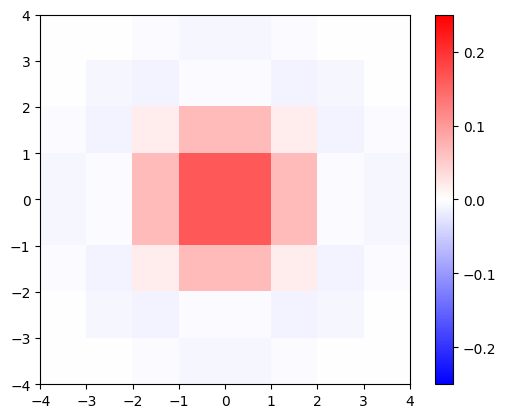

Frequency response:


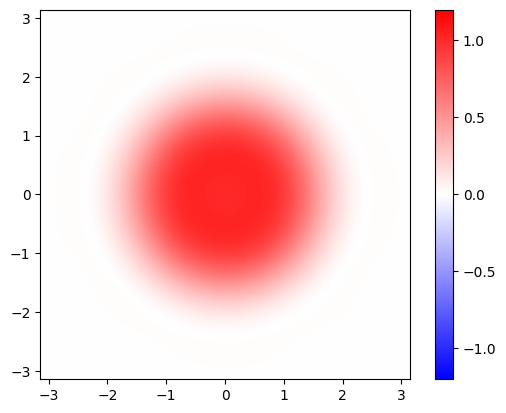

Odd size kernel:
Kernel:


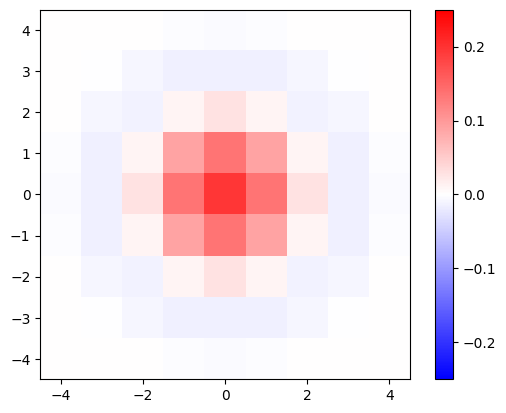

Frequency response:


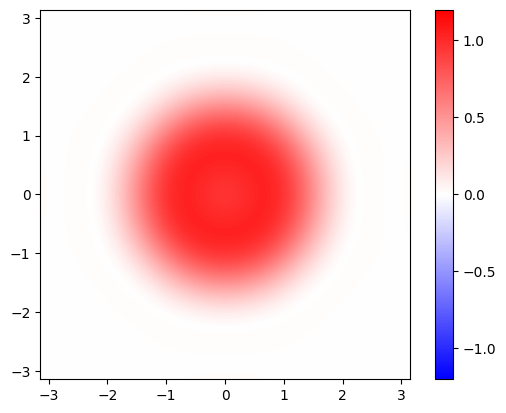

Batch size = 4


In [5]:
# Configuration
oversampling = 2  # Oversampling factor, 2 is a good choice
aa_even_kernel_size = 8 # Size of even sized antialiasing filter
aa_odd_kernel_size = aa_even_kernel_size + 1 # Size of odd sized antialiasing filter
approx_batch_size = 4
train_image_cropped_size = 512
photos_dir = "source_grass_images_subset"
save_filtered_photos_dir = None
#save_filtered_photos_dir = "filtered_grass_images_subset" # save folder, or None to disable saving

print("Even size kernel:")
test_kernel(windowed_circular_lowpass_kernel(np.pi/oversampling, aa_even_kernel_size))
print("Odd size kernel:")
test_kernel(windowed_circular_lowpass_kernel(np.pi/oversampling, aa_odd_kernel_size))

def channeled_kernel(kernel_prototype, num_channels):
  kernel_expanded = tf.expand_dims(kernel_prototype, 2)
  kernel_repeated = tf.repeat(kernel_expanded, num_channels, axis=2)
  return tf.expand_dims(kernel_repeated, -1)

def load_and_filter_image(filepath, channeled_kernel):
  image = tf.io.decode_png(tf.io.read_file(filepath), channels=3, dtype=tf.dtypes.uint8)
  image = tf.image.convert_image_dtype(image, dtype=tf.float32) * 2 - 1
  image = tf.nn.depthwise_conv2d([image], channeled_kernel, [1, 1, 1, 1], "VALID")[0]
  if save_filtered_photos_dir is not None:
    basename = tf.py_function(lambda string_tensor: os.path.basename(string_tensor.numpy()), [filepath], tf.string)
    tf.io.write_file(save_filtered_photos_dir + "/" + basename, tf.io.encode_png(tf.image.convert_image_dtype((image + 1)/2, dtype=tf.dtypes.uint8, saturate=True)))
  return image

train_dataset = tf.data.Dataset.list_files("test.png")
train_dataset = train_dataset.map(lambda filepath: load_and_filter_image(filepath, channeled_kernel(windowed_circular_lowpass_kernel(np.pi/oversampling, aa_even_kernel_size), 3)), num_parallel_calls=tf.data.experimental.AUTOTUNE, deterministic=False)

train_dataset = train_dataset.cache() # Load photos now instead of doing it again for each copy made in the next line
train_dataset = train_dataset.repeat(tf.math.floordiv(approx_batch_size, train_dataset.cardinality()))
train_dataset = train_dataset.cache()

batch_size = train_dataset.cardinality() # batch size
print("Batch size = " + str(batch_size.numpy()))

## Isotropic lowpass filtering layers
These layers apply a circularly symmmetrical lowpass filter. They preserve spatial centering of the data to facilitate skip connections and center cropping in the network.

`IsotropicLowpassFilterLayer` accepts `strides = 1` to preserve the feature map size and `strides = 2` to downsample it to half size. With `strides = 1`, the kernel size must be odd. With downsampling, only even input and kernel sizes are supported, resulting in even-sized output. `cutoff` is the cutoff frequency (before downsampling).

`IsotropicLowpassFilteredUpsampleLayer` doubles the spatial size of the feature map. `cutoff` is the cutoff frequency after upsampling. `kernel_size` must be even.

In [6]:
class IsotropicLowpassFilterLayer(tf.keras.layers.Layer):
  def __init__(self, cutoff, kernel_size, strides = 1, **kwargs):
    super(IsotropicLowpassFilterLayer, self).__init__(**kwargs)
    self.kernel_size = kernel_size
    self.strides = strides        
    assert self.strides == 1 or self.strides == 2, "Accepted values for strides are 1 and 2. Tuples or arrays are not accepted."
    if self.strides == 1:
      assert self.kernel_size % 2 == 1, "kernel_size must be odd when strides = 1"
    if self.strides == 2:
      assert self.kernel_size % 2 == 0, "kernel_size must be even when strides = 2"

    self.kernel_prototype = windowed_circular_lowpass_kernel(cutoff, self.kernel_size)

  def build(self, input_shape):
    self.filtering = tf.keras.layers.DepthwiseConv2D(self.kernel_size, trainable=False, use_bias=False, padding='same', strides=self.strides, weights=[channeled_kernel(self.kernel_prototype, input_shape[-1])])

  def call(self, inputs):
    return self.filtering(inputs)

def get_upsample_multiplication_tensor(input_shape):
  tile = tf.constant([[0, 0], [0, 4]], dtype=tf.float32)
  return tf.reshape(tf.tile(tile, [input_shape[-3], input_shape[-2]]), (1, input_shape[-3]*2, input_shape[-2]*2, 1))

class IsotropicLowpassFilteredUpsampleLayer(tf.keras.layers.Layer):
  def __init__(self, cutoff, kernel_size, **kwargs):
    super(IsotropicLowpassFilteredUpsampleLayer, self).__init__(**kwargs)
    self.kernel_size = kernel_size
    assert self.kernel_size % 2 == 0, "kernel_size must be even"
    self.upsampling = tf.keras.layers.UpSampling2D(size = (2, 2), interpolation='nearest')
    self.multiply = tf.keras.layers.Multiply()
    #self.zeropadding = tf.keras.layers.ZeroPadding2D(padding = ((0, 1), (0, 1)))  # not needed for input even -> output even
    self.kernel_prototype = windowed_circular_lowpass_kernel(cutoff, kernel_size)
    self.kernel_size = kernel_size

  def build(self, input_shape):
    self.multiplication_tensor = get_upsample_multiplication_tensor(input_shape)
    self.filtering = tf.keras.layers.DepthwiseConv2D(self.kernel_size, trainable=False, use_bias=False, padding='same', weights=[channeled_kernel(self.kernel_prototype, input_shape[-1])])

  def call(self, inputs):
    x = self.upsampling(inputs)
    x = self.multiply([x, self.multiplication_tensor])
    #x = self.zeropadding(x)  # not needed for input even -> output even
    x = self.filtering(x)
    return x    

if False:      
  print("Test input:")
  input_shapes = (aa_odd_kernel_size + 2, aa_odd_kernel_size + 2, 3)
  eye = tf.repeat(tf.expand_dims(tf.repeat(tf.expand_dims(tf.eye(input_shapes[0], input_shapes[1]), -1), repeats = input_shapes[2], axis = -1), 0), repeats = batch_size, axis = 0)
  plt.imshow(eye[0])
  plt.show()

  def TestModel(input_shapes):
    inputs = tf.keras.Input(input_shapes)
    outputs = IsotropicLowpassFilterLayer(np.pi/oversampling, aa_odd_kernel_size)(inputs)
    model = tf.keras.Model(inputs=inputs, outputs=outputs)    
    return model

  print("Isotropic lowpass filtered:")
  model = TestModel(input_shapes)
  output = model(eye)
  plt.imshow(output[0])
  plt.show()

  def TestModel(input_shapes):
    inputs = tf.keras.Input(input_shapes)
    outputs = IsotropicLowpassFilteredUpsampleLayer(np.pi/oversampling, aa_even_kernel_size)(inputs)
    model = tf.keras.Model(inputs=inputs, outputs=outputs)    
    return model

  print("Isotropic lowpass filtered upsampled:")
  model = TestModel(input_shapes)
  output = model(eye)
  plt.imshow(output[0])
  plt.show()

## RandomCropper
Crop images randomly. This should be done in the beginning of each epoch by calling RandomCropper.recrop()

In [7]:
class RandomCropper:
  def __init__(self, dataset, first_seed = None):
    if first_seed is None:
      first_seed = 1
      #first_seed = int(str(int((datetime.now() - datetime(1970, 1, 1)).total_seconds()*1_000_000))[::-1][:16])
    self.dataset_seeded = dataset.enumerate(first_seed)

  def recrop(self, size):
    cropped_dataset = self.dataset_seeded.map(lambda seed, image: tf.image.stateless_random_crop(image, (size, size, 3), [seed, 0]), num_parallel_calls=tf.data.experimental.AUTOTUNE, deterministic=False)
    self.dataset_seeded = self.dataset_seeded.map(lambda seed, image: (seed + self.dataset_seeded.cardinality(), image), num_parallel_calls=tf.data.experimental.AUTOTUNE, deterministic=False)
    return cropped_dataset

if False:
  train_dataset_cropper = RandomCropper(train_dataset)
  print("First recrop, first item:")
  iterator = iter(train_dataset_cropper.recrop(train_image_cropped_size))
  plt.imshow((next(iterator) + 1)/2)
  plt.show()
  print("Second recrop, first item:")
  iterator = iter(train_dataset_cropper.recrop(train_image_cropped_size))
  plt.imshow((next(iterator) + 1)/2)
  plt.show()
  print("Second recrop, second item:")
  plt.imshow((next(iterator) + 1)/2)
  plt.show()

## Generator model
Define the generator network, parameterized by input image size.

Generator network:


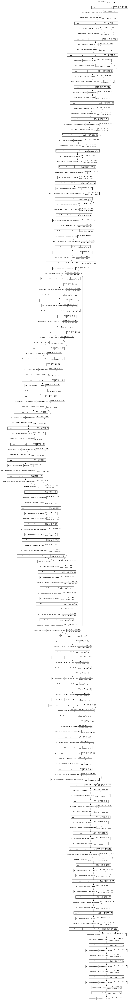

In [8]:
def Generator(input_size, down_nonlinearity, up_nonlinearity, initializer, learned_kernel_size, num_sublayers, num_resamplings, max_features, use_skip_connections):      
  inputs = tf.keras.Input(shape = (input_size, input_size, 1), name = "input")

  x = IsotropicLowpassFilterLayer(np.pi/oversampling, aa_odd_kernel_size, name = "input_antialias")(inputs)

  skip_connection_stack = []
  skip_connection_stack.append(x)

  n = 64
  for j in range(num_resamplings):
    for i in range(num_sublayers):
      x = tf.keras.layers.Conv2D(max_features if n > max_features else n, learned_kernel_size, kernel_initializer=initializer, use_bias = False, padding="same", name = f"down_{j}_subblock_{i}_learned_conv")(x)
      if j > 0:
        x = tf.keras.layers.BatchNormalization(name = f"down_{j}_subblock_{i}_batchnorm")(x) 
      x = tf.keras.layers.Activation(down_nonlinearity, name = f"down_{j}_subblock_{i}_nonlinearity")(x)
      x = IsotropicLowpassFilterLayer(np.pi/oversampling, aa_odd_kernel_size if i < num_sublayers - 1 else aa_even_kernel_size, strides = 1 if i < num_sublayers - 1 else 2, name = f"down_{j}_subblock_{i}_antialias" if i < num_sublayers - 1 else f"down_{j}_subblock_{i}_antialiased_downsample")(x)
    x = IsotropicLowpassFilterLayer(np.pi/oversampling, aa_odd_kernel_size, name = f"down_{j}_antialias")(x)
    if j < num_resamplings - 1:
      skip_connection_stack.append(x)
    n *= 2

  for j in range(num_resamplings):
    n //= 2
    x = IsotropicLowpassFilteredUpsampleLayer(np.pi/oversampling, aa_even_kernel_size, name = f"up_{j}_antialiased_upsample")(x)
    if use_skip_connections:
      skip_connection = skip_connection_stack.pop()
      x = tf.keras.layers.Concatenate()([x, skip_connection])
    #x = tf.keras.layers.Multiply(x[..., 0:x.get_shape()[-1]/4])(x.get_shape()[-1]/4
    for i in range(num_sublayers):
      x = tf.keras.layers.Conv2D(max_features if n > max_features else n, learned_kernel_size, kernel_initializer=initializer, use_bias = False, padding="same", name = f"up_{j}_subblock_{i}_learned_conv")(x)
      if j < num_resamplings - 1:
        x = tf.keras.layers.BatchNormalization(name = f"up_{j}_subblock_{i}_batchnorm")(x)
        #x = tf.keras.layers.Dropout(0.5)(x)
      x = tf.keras.layers.Activation(up_nonlinearity, name = f"up_{j}_subblock_{i}_nonlinearity")(x)
      x = IsotropicLowpassFilterLayer(np.pi/oversampling, aa_odd_kernel_size, name = f"up_{j}_subblock_{i}_antialias")(x)

  x = tf.keras.layers.Conv2D(3, learned_kernel_size, kernel_initializer=initializer, use_bias=False, padding="same", name = "to_rgb_learned_conv")(x)
  x = tf.keras.layers.Activation("tanh", name = "output_nonlinearity")(x)  
  x = IsotropicLowpassFilterLayer(np.pi/oversampling, aa_odd_kernel_size, name = "output_antialias")(x)
  #x = tf.keras.layers.CenterCrop(x.get_shape()[-3]//2, x.get_shape()[-2]//2, name = "output_crop")(x)

  return  tf.keras.Model(inputs=inputs, outputs=x)

generator_input_size = train_image_cropped_size

generator = Generator(generator_input_size, tf.keras.layers.LeakyReLU(), tf.keras.layers.LeakyReLU(), "glorot_uniform", learned_kernel_size = 5, num_sublayers = 3, num_resamplings = 7, max_features = 256, use_skip_connections = True)
generator.build((generator_input_size, generator_input_size, 1))

print("Generator network:")
display(tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64))

Generator input:


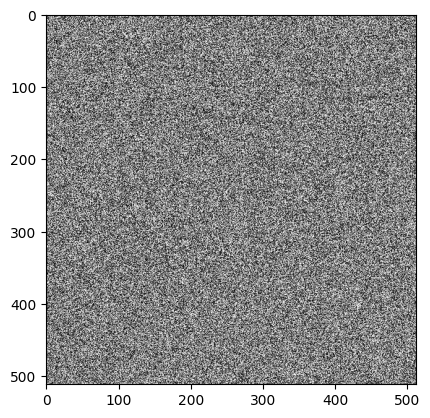

Generator output:


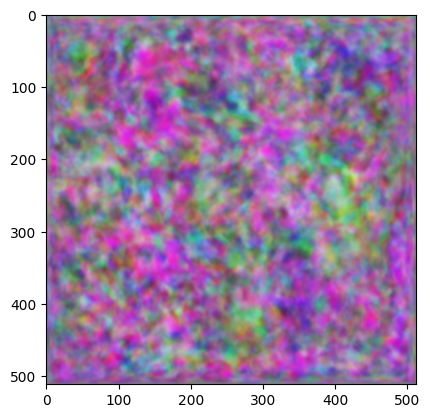

In [9]:
# Generate, display
z = tf.random.uniform((1, generator_input_size, generator_input_size, 1), minval=-1, maxval=1)
print("Generator input:")
plt.imshow(np.repeat((z[0].numpy() + 1)/2, repeats = 3, axis = -1))
plt.show()
print("Generator output:")
x = generator(z, training = True)[0]
plt.imshow((x.numpy() + 1)/2)
plt.show()

## Generator loss

In [10]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)
def generator_loss(disc_generated_output, gen_output):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
    return gan_loss

## Discriminator model

Discriminator network:


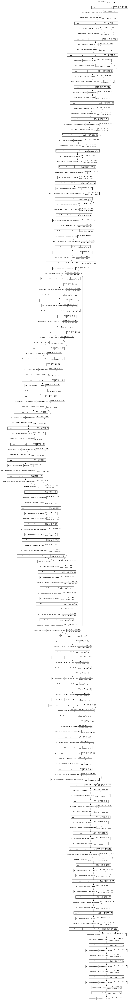

In [11]:
def Discriminator(input_size, down_nonlinearity, initializer, learned_kernel_size, num_sublayers, num_resamplings, max_features):      
    inputs = tf.keras.Input(shape = (input_size, input_size, 3), name = "input")
  
    x = inputs
  
    n = 64
    for j in range(num_resamplings):
        for i in range(num_sublayers):
            x = tf.keras.layers.Conv2D(max_features if n > max_features else n, learned_kernel_size, kernel_initializer=initializer, use_bias=True, padding="same", name = f"down_{j}_subblock_{i}_learned_conv")(x)
            if j > 0:
                x = tf.keras.layers.BatchNormalization(name = f"down_{j}_subblock_{i}_batchnorm")(x)             
            x = tf.keras.layers.Activation(down_nonlinearity, name = f"down_{j}_subblock_{i}_nonlinearity")(x)
            x = IsotropicLowpassFilterLayer(np.pi/oversampling, aa_odd_kernel_size if i < num_sublayers - 1 else aa_even_kernel_size, strides = 1 if i < num_sublayers - 1 else 2, name = f"down_{j}_subblock_{i}_antialias" if i < num_sublayers - 1 else f"down_{j}_subblock_{i}_antialiased_downsample")(x)
        x = IsotropicLowpassFilterLayer(np.pi/oversampling, aa_odd_kernel_size, name = f"down_{j}_antialias")(x)
        n *= 2

    x = tf.keras.layers.Conv2D(1, learned_kernel_size, kernel_initializer=initializer, use_bias=True, padding="same", name = "to_output_learned_conv")(x)
    x = IsotropicLowpassFilterLayer(np.pi/oversampling, aa_odd_kernel_size, name = "output_antialias")(x)

    return  tf.keras.Model(inputs=inputs, outputs=x)

discriminator = Discriminator(train_image_cropped_size, tf.keras.layers.LeakyReLU(), "glorot_uniform", learned_kernel_size = 5, num_sublayers = 3, num_resamplings = 6, max_features = 256)
discriminator.build((train_image_cropped_size, train_image_cropped_size, 1))

print("Discriminator network:")
display(tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64))


Sample training target image:


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


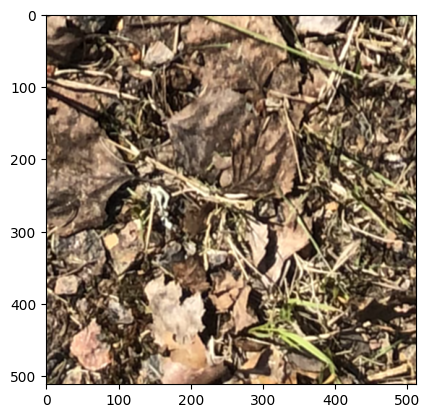

Discriminator output:


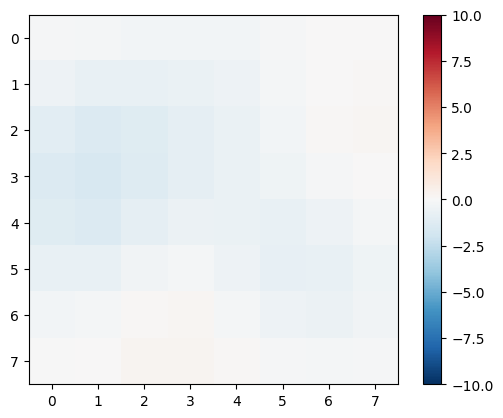

Sample generated image, before training:


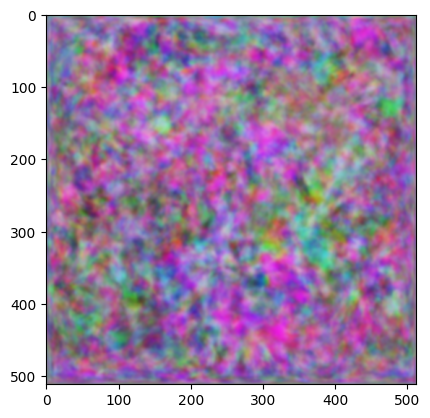

Discriminator output:


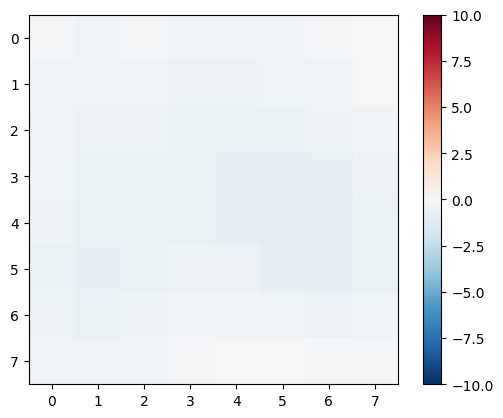

In [12]:
z = tf.random.uniform((1, generator_input_size, generator_input_size, 1), minval=-1, maxval=1)

print("Sample training target image:")
train_dataset_cropper = RandomCropper(train_dataset)
iterator = iter(train_dataset_cropper.recrop(train_image_cropped_size))
train_image = next(iterator)
plt.imshow((train_image + 1)/2)
plt.show()

print("Discriminator output:")
disc_out = discriminator(train_image[tf.newaxis, ...], training=True)
plt.imshow(disc_out[0, ..., -1], cmap='RdBu_r')
plt.clim(-10,10)
plt.colorbar()
plt.show()

print("Sample generated image, before training:")
generated_image = generator(z, training = True)[0]
plt.imshow((generated_image.numpy() + 1)/2)
plt.show()

print("Discriminator output:")
disc_out = discriminator(generated_image[tf.newaxis, ...], training=True)
plt.imshow(disc_out[0, ..., -1], cmap='RdBu_r')
plt.clim(-10,10)
plt.colorbar()
plt.show()

## Discriminator loss

In [13]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
  total_disc_loss = real_loss + generated_loss
  return total_disc_loss

## Optimizers

In [14]:
# tf.keras.optimizers.Adam(learning_rate=0.01, beta_1=0.5, beta_2=0.99, epsilon=1e-07)
#generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
#discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_optimizer = tf.keras.optimizers.SGD(1e-3) # start with 1e-3, then change it to 1e-4
discriminator_optimizer = tf.keras.optimizers.SGD(1e-3)

## Set up model checkpoint loading or saving

In [15]:
checkpoint_dir = './training_checkpoints_gan'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator=generator, discriminator=discriminator)

## Save checkpoint

In [16]:
#checkpoint.save(file_prefix=checkpoint_prefix)

## Train the GAN

In [17]:
def calculate_red(images1, images2, channel):
    # calculate activations
    # calculate mean and covariance statistics
    mu1, sigma1 = np.mean(images1[:, :, channel], axis=0), np.cov(images1[:, :, channel], rowvar=False)
    mu2, sigma2 = np.mean(images2[:, :, channel], axis=0), np.cov(images2[:, :, channel], rowvar=False)
    # calculate sum squared difference between means
    ssdiff = np.sum((mu1 - mu2)**2.0)
    # calculate sqrt of product between cov
    covmean = sqrtm(sigma1.dot(sigma2))
    # check and correct imaginary numbers from sqrt
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    # calculate score
    red = ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)
    return red

In [18]:
# fid between images1 and images1
red = calculate_red(train_image, train_image, 0)
print('RED (same): %.3f' % red)
# fid between images1 and images2
red = calculate_red(train_image, generated_image, 0)
print('RED (different): %.3f' % red)

RED (same): -0.000
RED (different): 95.224


In [19]:
calculate_red(train_image, generated_image, 2)

201.8277225948916

In [20]:
def calculate_fid_step1(model, repeats, generator):
    
    act1 = []
    act2 = []
    
    train_dataset_cropper = RandomCropper(train_dataset)
    cropped_batch = tf.stack(list(train_dataset_cropper.recrop(train_image_cropped_size)))
    
    for i in range(repeats):
        # calculate activations
        z = tf.random.uniform((batch_size, generator_input_size, generator_input_size, 1), minval=0, maxval=None)
        generated_images = generator(z, training = True)
        act1.append(model.predict(generated_images))
        act2.append(model.predict(cropped_batch))
    
    act1 = np.array(act1)
    act2 = np.array(act2)
    
    act1 = np.reshape(act1, (4 * repeats, 2048))
    act2 = np.reshape(act2, (4 * repeats, 2048))
    
    return act1, act2

def calculate_fid_step2(acts1, acts2):
    # calculate mean and covariance statistics
    mu1, sigma1 = acts1.mean(axis=0), np.cov(acts1, rowvar=False)
    mu2, sigma2 = acts2.mean(axis=0), np.cov(acts2, rowvar=False)
    # calculate sum squared difference between means
    ssdiff = np.sum((mu1 - mu2)**2.0)
    # calculate sqrt of product between cov
    covmean = sqrtm(sigma1.dot(sigma2))
    # check and correct imaginary numbers from sqrt
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    # calculate score
    fid = ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)
    return fid

In [21]:
epochs = 10000
display_every = 10 # How many epochs to skip between data displays

#checkpoint.save(file_prefix=checkpoint_prefix)
#checkpoint.restore(file_prefix=checkpoint_prefix)

def crop_output(thing):
    cropper = tf.keras.layers.CenterCrop(thing.get_shape()[-3]//4, thing.get_shape()[-2]//4, name = "discriminator_output_crop")
    return cropper

@tf.function
def train_step(cropped_batch, z, epoch):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(z, training=True)

    disc_real_output = discriminator(cropped_batch, training=True)
    disc_output_cropper = crop_output(disc_real_output)
    disc_real_output = disc_output_cropper(disc_real_output)
    disc_generated_output = discriminator(gen_output, training=True)
    disc_generated_output = disc_output_cropper(disc_generated_output)

    gen_gan_loss = generator_loss(disc_generated_output, gen_output)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_gan_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
    tf.summary.scalar('disc_loss', disc_loss, step=epoch)

def checkpoint_save(epoch, inEpochs = 100, trigger = False):
    if mode == "every":
        if (epoch + 1) % inEpochs == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)
    elif mode == "fid":
        checkpoint.save(file_prefix=checkpoint_prefix)
    
def plot_batches(subject):
    plt.subplots(batch_size.numpy()//2, 4, figsize = (28,7*(batch_size.numpy()//2)))
    for i in range(batch_size):
        plt.subplot(batch_size.numpy()//2, 4, 1 + i*2)
        #cropped_target_image = tf.keras.layers.CenterCrop(cropped_batch.get_shape()[-3]//2, cropped_batch.get_shape()[-2]//2)(cropped_batch[0])
        plt.imshow(np.clip((subject[i].numpy() + 1)/2, 0, 1))
        plt.subplot(batch_size.numpy()//2, 4, 2 + i*2)
        plt.imshow(disc_out[i][..., -1], cmap='RdBu_r')
        plt.clim(-10,10)
    plt.show()

const_z = tf.random.uniform((batch_size, generator_input_size, generator_input_size, 1), minval=0, maxval=None)
    
def image_save():
    
    
def fit(epochs, dataset):
  train_dataset_cropper = RandomCropper(train_dataset)
  red_list = []
  fid_list = []

  for epoch in range(epochs + 1):
    z = tf.random.uniform((batch_size, generator_input_size, generator_input_size, 1), minval=0, maxval=None)    
    cropped_batch = tf.stack(list(train_dataset_cropper.recrop(train_image_cropped_size)))
    # Train
    start = time.time()
    clear_output(wait=True)

    if epoch % display_every == 0:
      print("Target images and discriminator outputs (only 2x2 center is used in loss):")
      disc_out = discriminator(cropped_batch, training=True)
      plot_batches(cropped_batch)

      print("Generated images and discriminator outputs (only 2x2 center is used in loss):")
      generated_images = generator(z, training = True)
      disc_out = discriminator(generated_images, training=True)
      #cropped_generated_image = tf.keras.layers.CenterCrop(generated_image.get_shape()[-3]//2, generated_image.get_shape()[-2]//2)(generated_image)
      plot_batches(generated_images)
    
    model = InceptionV3(include_top=False, pooling='avg')

    act1, act2 = calculate_fid_step1(model, 16, generator)
    latest_fid = calculate_fid_step2(act1, act2)
    if epoch > 0 and latest_fid * 0.99 < minimal_fid:
        minimal_fid = latest_fid 
        checkpoint_save(epoch, "fid")
    elif epoch == 0:
        minimal_fid = latest_fid
    print('Latest FID: %.3f' % latest_fid)
    
    fid_list.append(latest_fid)
    
    latest_red = np.mean([
        (calculate_red(np.clip((cropped_batch[0].numpy() + 1)/2, 0, 1), np.clip((generated_images[0].numpy() + 1)/2, 0, 1), 0)),
         (calculate_red(np.clip((cropped_batch[0].numpy() + 1)/2, 0, 1), np.clip((generated_images[0].numpy() + 1)/2, 0, 1), 1)),
          (calculate_red(np.clip((cropped_batch[0].numpy() + 1)/2, 0, 1), np.clip((generated_images[0].numpy() + 1)/2, 0, 1), 2))
    ])
                
    red_list.append(latest_red)
    
    print('Latest FID: %.3f' % latest_red)
    plt.plot(range(len(red_list)), red_list)
    plt.plot(range(len(fid_list)), fid_list)
    plt.show()

    train_step(cropped_batch, z, epoch)

In [22]:
import datetime
log_dir = "logs/"
im_dir = "images/fit" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + "/"
os.makedirs(im_dir)
summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [25]:
%reload_ext tensorboard
#%tensorboard --logdir {log_dir} --host localhost --port 6213 #Windows
%tensorboard --logdir {log_dir} --bind_all #Docker

Target images and discriminator outputs (only 2x2 center is used in loss):


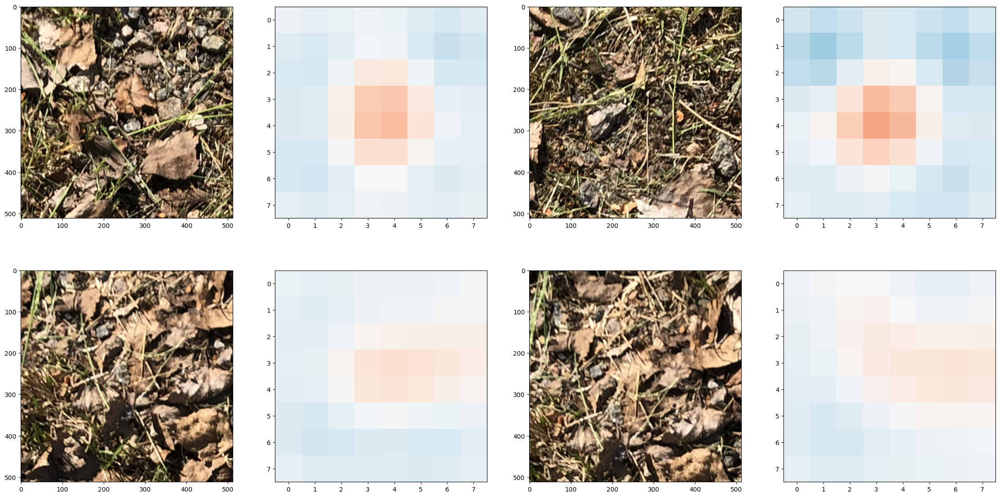

Generated images and discriminator outputs (only 2x2 center is used in loss):


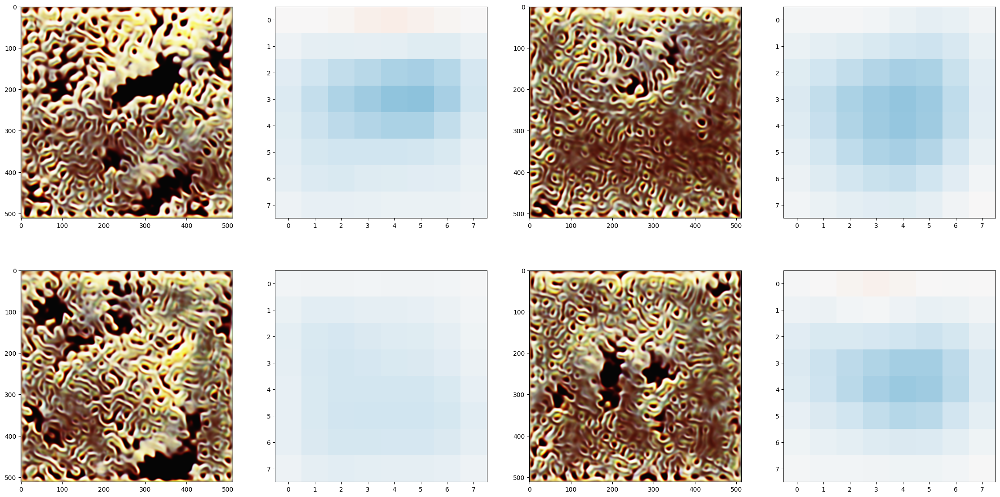

KeyboardInterrupt: 

In [24]:
fit(epochs, train_dataset)